# Plot sensitivity tests, comparison between scaling inputs and scaling output

In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import cartopy.crs as ccrs
#from utils_GP import *
import pandas as pd

In [2]:
def lat_weighted_mean(x):
    weights = np.cos(np.deg2rad(x.lat))
    return x.weighted(weights).mean(['lat', 'lon'])

In [3]:
def scaling_fig(data_list, title, divnorm, diffnorm, year_slice):
    fig, axs = plt.subplots(4,3, figsize=(15, 15), subplot_kw={'projection': ccrs.Robinson()})
    axs = axs.flatten()
    titles = ['inputs x0.1', 'inputs x0.5', title, 'inputs x2']

    for ii in range(4):
        data = data_list[ii]
        data_norm = [0.1, 0.5, 1, 2]
        if year_slice:
            data_mean = data['posterior'].sel(year=year_slice).mean('year')
            norm_data = (data_list[2]['posterior']*data_norm[ii]).sel(year=year_slice).mean('year')
            robust_data = (data['posterior'].where(np.abs(data['posterior']) > 0.5*data['posterior std'])).sel(year=year_slice).mean('year', skipna=True)
        else:
            data_mean = data['posterior']
            norm_data = (data_list[2]['posterior']*data_norm[ii])
            robust_data = (data['posterior'].where(np.abs(data['posterior']) > 0.5*data['posterior std']))

        #first column plot data:
        ax = axs[ii*3] # fist column (0,3,6,9)
        ax.coastlines()
        data_mean.plot(ax=ax, transform=ccrs.PlateCarree(), norm=divnorm, cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
        ax.pcolor(robust_data.lon, robust_data.lat, robust_data, transform=ccrs.PlateCarree(), hatch='////', alpha=0)
        ax.set_title(titles[ii])

        #second column plot data normalized to original:
        ax = axs[(ii*3)+1] # second column (1,4,7,10)
        ax.coastlines()
        norm_data.plot(ax=ax, transform=ccrs.PlateCarree(), norm=divnorm, cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
        ax.set_title(title + ' x' + str(data_norm[ii]))

        #third column plot difference:
        ax = axs[(ii*3)+2] # third column (2,5,8,11)
        ax.coastlines()
        norm_diff = data_mean - norm_data
        norm_diff.plot(ax=ax, transform=ccrs.PlateCarree(), norm=diffnorm, cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
        ax.set_title('difference')

    fig.tight_layout()

In [12]:
def plot_noresm_diff(NorESM_mean, AeroGP_mean):
    divnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)

    proj = ccrs.Robinson()

    with sns.plotting_context("talk"):
            
        fig = plt.figure(figsize=(18, 10))
        ## Truth
        plt.subplot(131, projection=proj)
        NorESM_mean.plot(transform=ccrs.PlateCarree(central_longitude=0.0),cmap="coolwarm", norm=divnorm, add_colorbar=False)
        plt.gca().coastlines()
        plt.setp(plt.gca(), title='NorESM')

        # Emulator
        plt.subplot(132, projection=proj)
        AeroGP_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm, add_colorbar=False)
        plt.gca().coastlines()
        plt.setp(plt.gca(), title='AeroGP')

        # differnce
        plt.subplot(133, projection=proj)
        (AeroGP_mean-NorESM_mean).plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm, cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
        plt.gca().coastlines()
        plt.setp(plt.gca(), title='AeroGP - NorESM')


In [32]:
histaer_4000it = xr.open_dataset('../logs/testing/logs_hist-aer lessregions/posterior_predictY_hist-aer_20250318-221042.nc')
histaer_6000it = xr.open_dataset('../logs/testing/logs_hist-aer lessregions_6000it/posterior_predictY_hist-aer_20250320-231256.nc')
histaer_100id_5000it = xr.open_dataset('../logs/testing/histaer_lessregions_2/posterior_predictY_hist-aer_20250324-184954.nc')
histaer_1lin = xr.open_dataset('../logs/testing/histaer_lessregions_3/posterior_predictY_hist-aer_20250324-193235.nc')
histaer_NorESM = xr.open_dataset('../training_data_v2/outputs_hist-aer.nc')

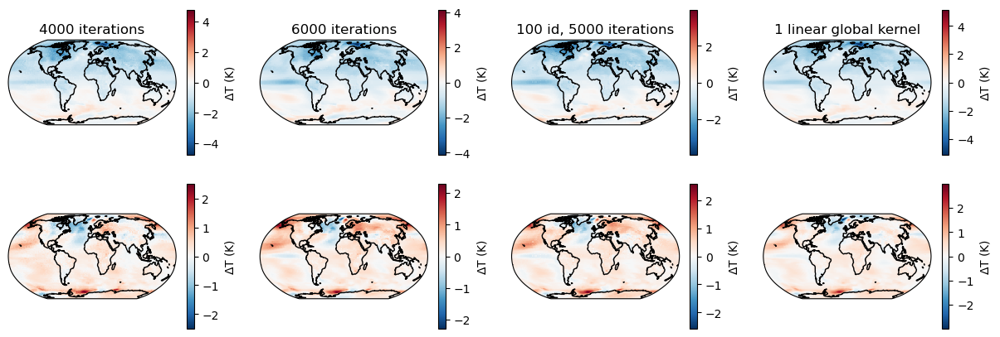

In [33]:
fig, axs = plt.subplots(2,4, figsize=(15, 5), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.flatten()
yearslice = slice(1995,2014)

histaer_4000it['posterior'].sel(year=yearslice).mean('year').plot(ax=axs[0], transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
axs[0].coastlines()
histaer_6000it['posterior'].sel(year=yearslice).mean('year').plot(ax=axs[1], transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
axs[1].coastlines()
histaer_100id_5000it['posterior'].sel(year=yearslice).mean('year').plot(ax=axs[2], transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
axs[2].coastlines()
histaer_1lin['posterior'].sel(year=yearslice).mean('year').plot(ax=axs[3], transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
axs[3].coastlines()
axs[0].set_title('4000 iterations')
axs[1].set_title('6000 iterations')
axs[2].set_title('100 id, 5000 iterations')
axs[3].set_title('1 linear global kernel')

(histaer_4000it['posterior'].sel(year=yearslice).mean('year') - histaer_NorESM['tas_diff'].sel(year=yearslice).mean('year')).plot(ax=axs[4], transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
axs[4].coastlines()
(histaer_6000it['posterior'].sel(year=yearslice).mean('year') - histaer_NorESM['tas_diff'].sel(year=yearslice).mean('year')).plot(ax=axs[5], transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
axs[5].coastlines()
(histaer_100id_5000it['posterior'].sel(year=yearslice).mean('year') - histaer_NorESM['tas_diff'].sel(year=yearslice).mean('year')).plot(ax=axs[6], transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
axs[6].coastlines()
(histaer_1lin['posterior'].sel(year=yearslice).mean('year') - histaer_NorESM['tas_diff'].sel(year=yearslice).mean('year')).plot(ax=axs[7], transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
axs[7].coastlines()


In [8]:
histaer = xr.open_dataset('../logs/lr_1lin/hist-aer/posterior_predictY_hist-aer_20250324-193235.nc')
histaer_01 = xr.open_dataset('../logs/lr_1lin/hist-aer/scaling_exp/posterior_predictY_histaer01_20250324-202133.nc')
histaer_05 = xr.open_dataset('../logs/lr_1lin/hist-aer/scaling_exp/posterior_predictY_histaer05_20250324-202210.nc')
histaer_2 = xr.open_dataset('../logs/lr_1lin/hist-aer/scaling_exp/posterior_predictY_histaer2_20250324-202237.nc')

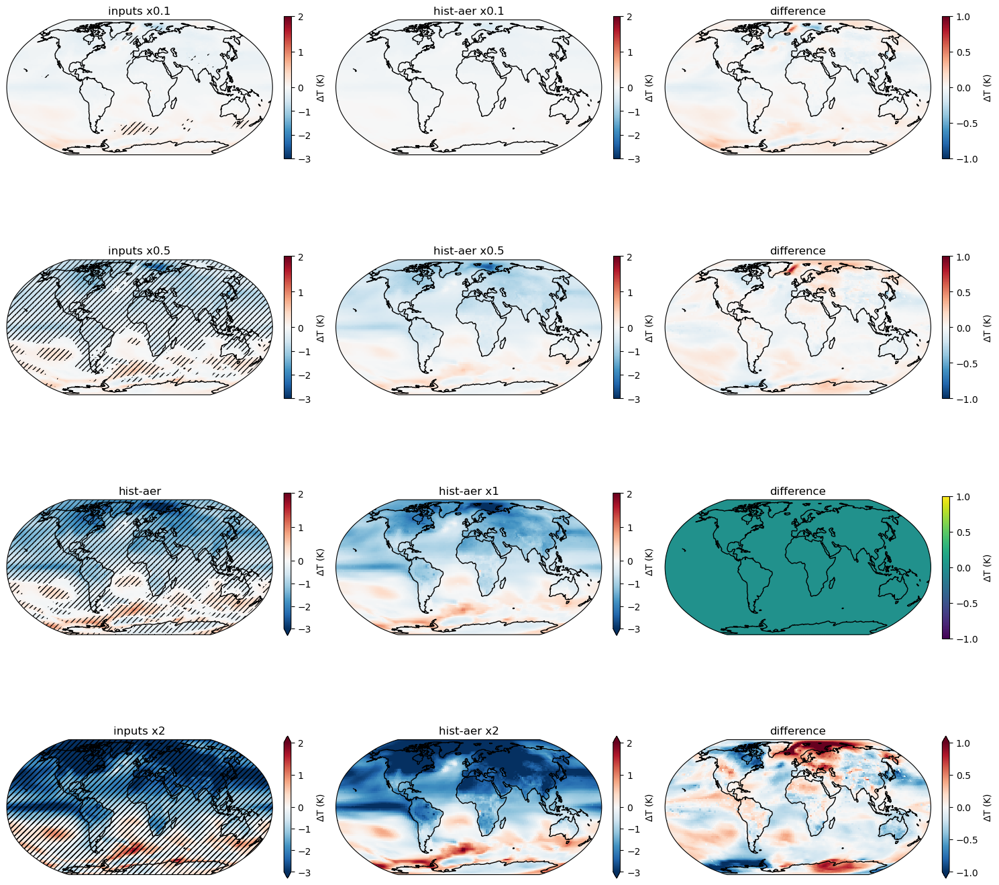

In [17]:
#setup figure for looking at scaling:
# Column 1 is AeroGP posterior given scaled inputs, Column 2 is the hist-aer output scaled by the same factor, Column 3 is the difference between the two.
data_list = [histaer_01, histaer_05, histaer, histaer_2]
title = 'hist-aer'
divnorm = colors.TwoSlopeNorm(vmin=-3., vcenter=0., vmax=2.)
diffnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
year_slice = slice(1995,2014)

scaling_fig(data_list, title, divnorm, diffnorm, year_slice)

In [32]:
eu7_so2 = xr.open_dataset('../logs/lr_1lin/7xEU SO2 only/posterior_predictY_7xEU_SO2_20250325-021538.nc')
eu7_so2_01 = xr.open_dataset('../logs/lr_1lin/7xEU SO2 only/scaling_exp/posterior_predictY_7xEU_SO2_01_20250325-170132.nc')
eu7_so2_05 = xr.open_dataset('../logs/lr_1lin/7xEU SO2 only/scaling_exp/posterior_predictY_7xEU_SO2_05_20250325-170217.nc')
eu7_so2_2 = xr.open_dataset('../logs/lr_1lin/7xEU SO2 only/scaling_exp/posterior_predictY_7xEU_SO2_2_20250325-170254.nc')

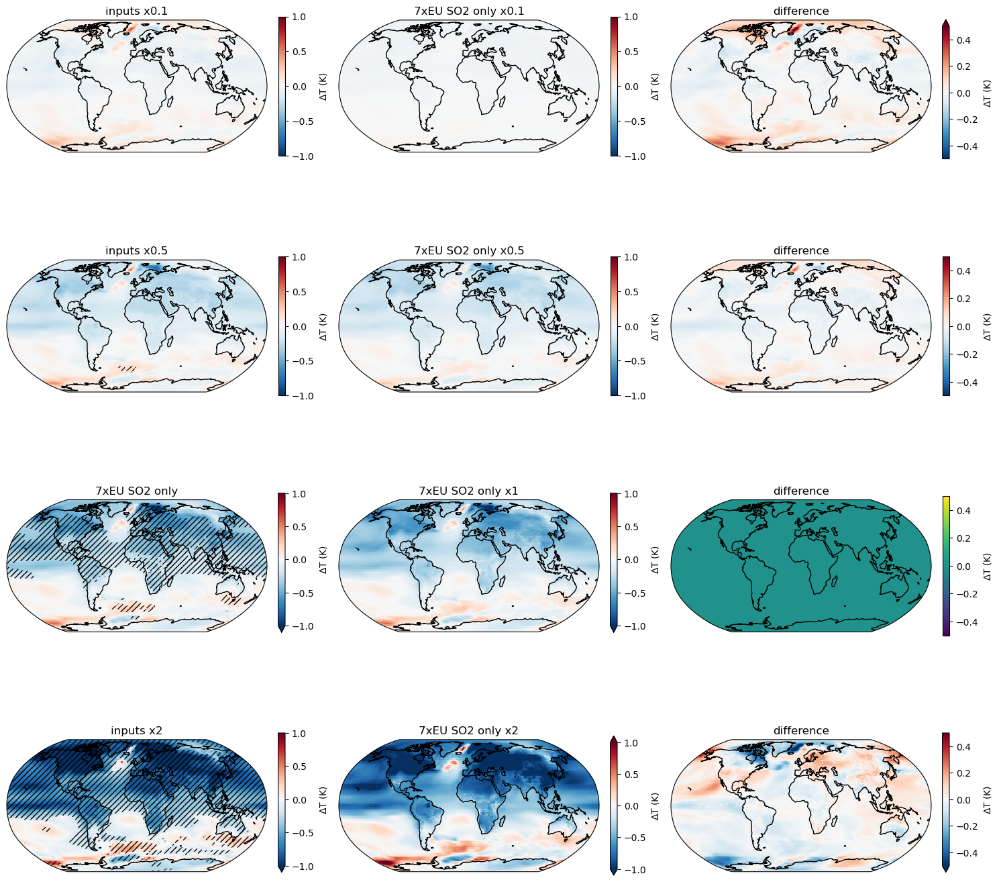

In [36]:
#setup figure for looking at scaling:
# Column 1 is AeroGP posterior given scaled inputs, Column 2 is the hist-aer output scaled by the same factor, Column 3 is the difference between the two.
data_list = [eu7_so2_01, eu7_so2_05, eu7_so2, eu7_so2_2]
title = '7xEU SO2 only'
divnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
diffnorm = colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5)

scaling_fig(data_list, title, divnorm, diffnorm, None)

In [37]:
sa10_so2 = xr.open_dataset('../logs/lr_1lin/10xSA SO2 only/posterior_predictY_10xSA_SO2_20250325-075655.nc')
sa10_so2_01 = xr.open_dataset('../logs/lr_1lin/10xSA SO2 only/scaling_exp/posterior_predictY_10xSA_SO2_01_20250325-170535.nc')
sa10_so2_05 = xr.open_dataset('../logs/lr_1lin/10xSA SO2 only/scaling_exp/posterior_predictY_10xSA_SO2_05_20250325-170442.nc')
sa10_so2_2 = xr.open_dataset('../logs/lr_1lin/10xSA SO2 only/scaling_exp/posterior_predictY_10xSA_SO2_2_20250325-170403.nc')

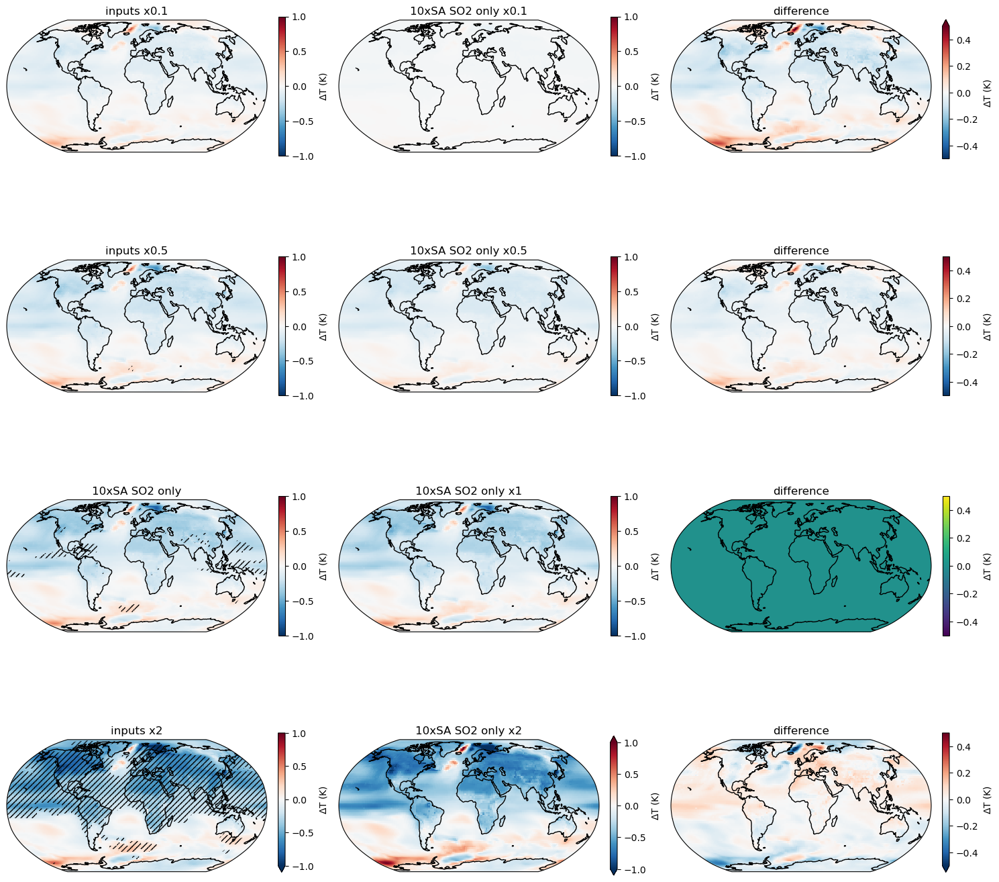

In [38]:
#setup figure for looking at scaling:
# Column 1 is AeroGP posterior given scaled inputs, Column 2 is the hist-aer output scaled by the same factor, Column 3 is the difference between the two.
data_list = [sa10_so2_01, sa10_so2_05, sa10_so2, sa10_so2_2]
title = '10xSA SO2 only'
divnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
diffnorm = colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5)

scaling_fig(data_list, title, divnorm, diffnorm, None)

Text(0.5, 1.0, '10xSA SO2 only *1.5 - 7xEU SO2 only')

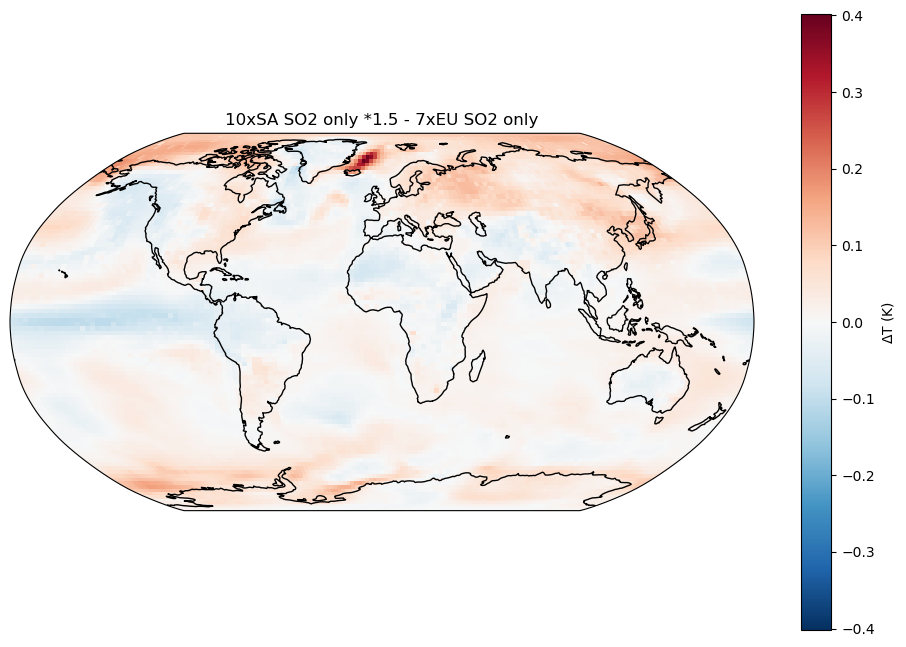

In [ ]:
#7xEU SO2 has 1.5x more global SO2 emissions than 10xSA SO2, so this is to see if the temperature repsonse is the same but scaled. 

fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.Robinson())
ax.coastlines()
((sa10_so2['posterior']*1.5)-eu7_so2['posterior']).plot(ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
ax.set_title('10xSA SO2 only *1.5 - 7xEU SO2 only')
#plt.pcolor(sa10_so2['posterior'].lon, sa10_so2['posterior'].lat, sa10_so2['posterior'].where(np.abs(sa10_so2['posterior']) > 0.5*sa10_so2['posterior std']), transform=ccrs.PlateCarree(), hatch='////', alpha=0)

In [3]:
#ramip EA early March 2025 - just changing to new regions:

ramipea = xr.open_dataset('../logs/logs_RAMIP EA/posterior_predictY_ramip_ea_20250305-043748.nc')
ramipea_01 = xr.open_dataset('../logs/logs_RAMIP EA/sensitivity_test/posterior_predictY_ramipEA01_20250311-211946.nc')
ramipea_05 = xr.open_dataset('../logs/logs_RAMIP EA/sensitivity_test/posterior_predictY_ramipEA05_20250311-212003.nc')
ramipea_2 = xr.open_dataset('../logs/logs_RAMIP EA/sensitivity_test/posterior_predictY_ramipEA2_20250311-212022.nc')

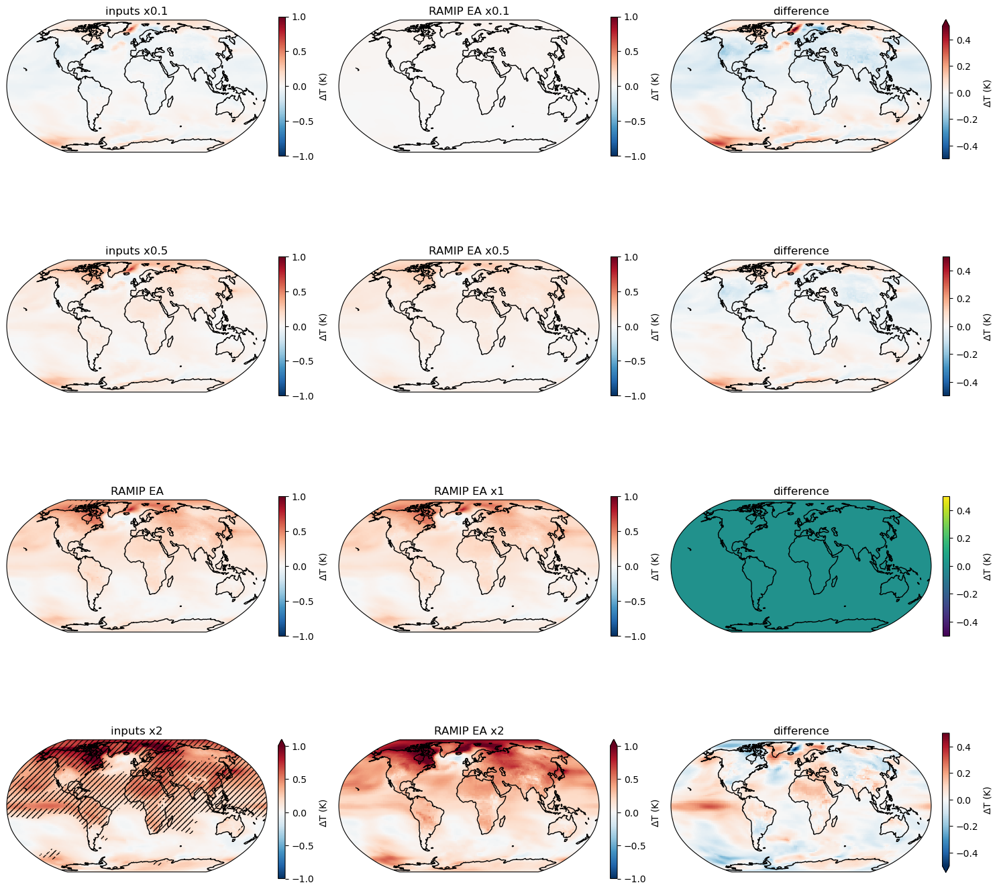

In [9]:
data_list = [ramipea_01, ramipea_05, ramipea, ramipea_2]
title = 'RAMIP EA'
divnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
diffnorm = colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5)
year_slice = slice(2045,2064)

scaling_fig(data_list, title, divnorm, diffnorm, year_slice)

<xarray.DataArray ()> Size: 8B
array(-0.00365512)


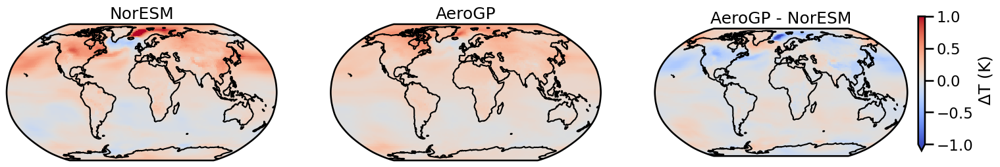

In [18]:
#plot difference with NorESM:
ramipea_NorESM = xr.open_dataset('../training_data_v2/outputs_ramip_ea.nc')
plot_noresm_diff(ramipea_NorESM['tas_diff'].sel(year=slice(2045,2064)).mean('year'), ramipea['posterior'].sel(year=slice(2045,2064)).mean('year'))
print(lat_weighted_mean(ramipea['posterior'].sel(year=slice(2045,2064)).mean('year')-ramipea_NorESM['tas_diff'].sel(year=slice(2045,2064)).mean('year')))

In [19]:
ramipea = xr.open_dataset('../logs/lr_1lin/RAMIP EA/posterior_predictY_ramip_ea_20250324-205726.nc')
ramipea_01 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramipEA01_20250324-211007.nc')
ramipea_05 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramipEA05_20250324-211030.nc')
ramipea_2 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramipEA2_20250324-211102.nc')

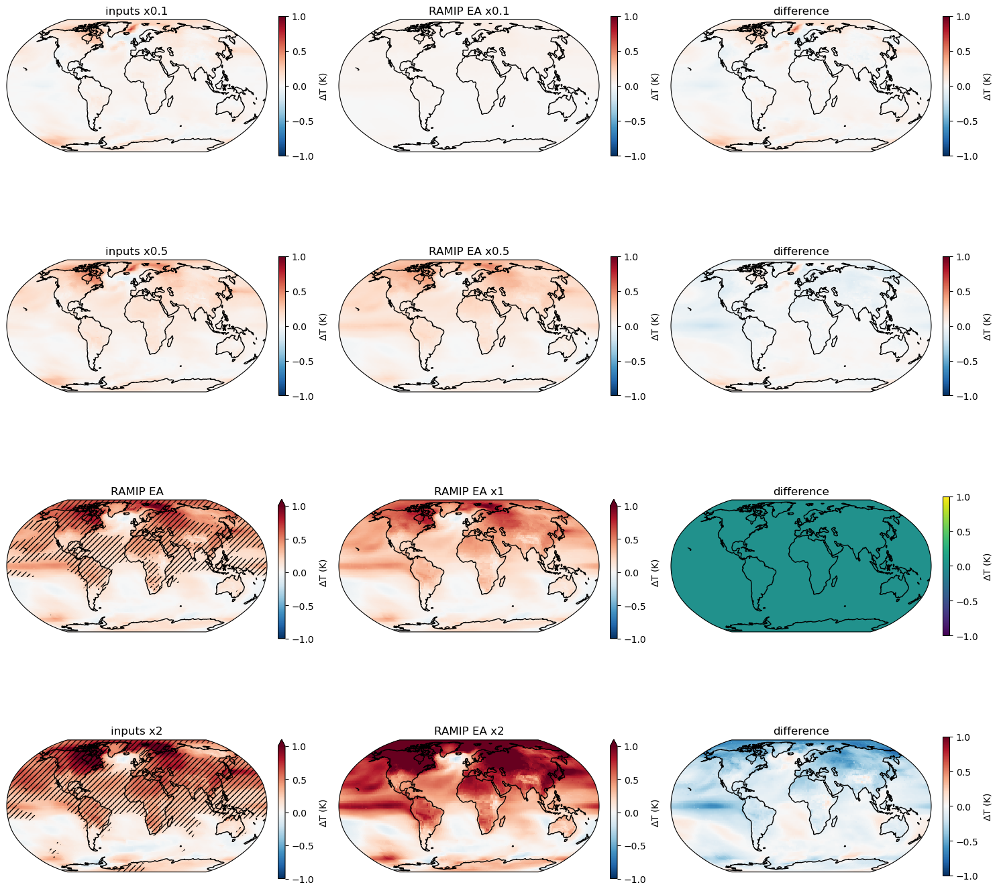

In [50]:
#setup figure for looking at scaling:
# Column 1 is AeroGP posterior given scaled inputs, Column 2 is the hist-aer output scaled by the same factor, Column 3 is the difference between the two.
data_list = [ramipea_01, ramipea_05, ramipea, ramipea_2]
title = 'RAMIP EA'
divnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
diffnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
year_slice = slice(2045,2064)

scaling_fig(data_list, title, divnorm, diffnorm, year_slice)

<xarray.DataArray ()> Size: 8B
array(0.0921013)


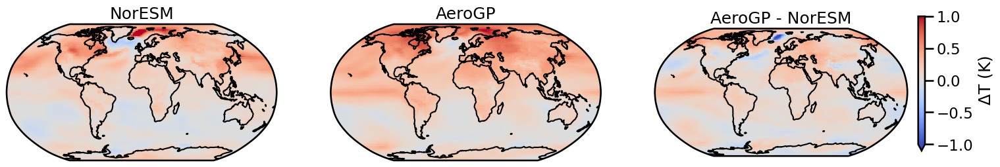

In [20]:
plot_noresm_diff(ramipea_NorESM['tas_diff'].sel(year=slice(2045,2064)).mean('year'), ramipea['posterior'].sel(year=slice(2045,2064)).mean('year'))
print(lat_weighted_mean(ramipea['posterior'].sel(year=slice(2045,2064)).mean('year')-ramipea_NorESM['tas_diff'].sel(year=slice(2045,2064)).mean('year')))

In [57]:
ea0_so2 = xr.open_dataset('../logs/lr_1lin/0xEA SO2 only/posterior_predictY_0xEA_SO2_20250325-002212.nc')
ea0_so2_2 = xr.open_dataset('../logs/lr_1lin/0xEA SO2 only/posterior_predictY_0xEA_SO2_2_20250325-101830.nc')

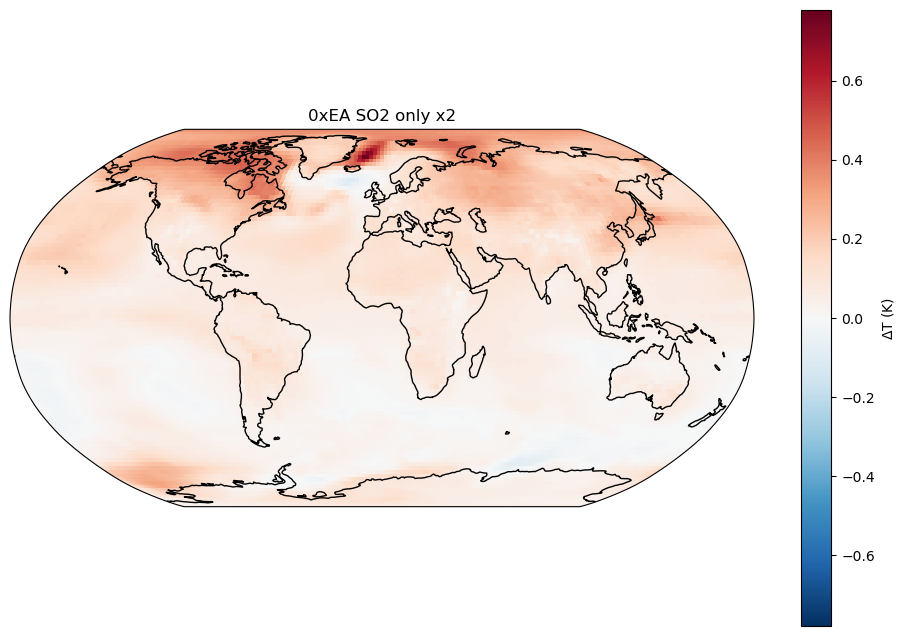

In [59]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.Robinson())
ax.coastlines()
ea0_so2_2['posterior'].plot(ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
ax.set_title('0xEA SO2 only x2')
plt.pcolor(ea0_so2_2['posterior'].lon, ea0_so2_2['posterior'].lat, ea0_so2_2['posterior'].where(np.abs(ea0_so2_2['posterior']) > 0.5*ea0_so2_2['posterior std']), transform=ccrs.PlateCarree(), hatch='////', alpha=0)

In [22]:
ramipea_so2only_01 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea01_so2only_20250325-103139.nc')
ramipea_so2only_05 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea05_so2only_20250325-103050.nc')
ramipea_so2only = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea_so2only_20250325-103017.nc')
ramipea_so2only_2 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea2_so2only_20250325-102602.nc')

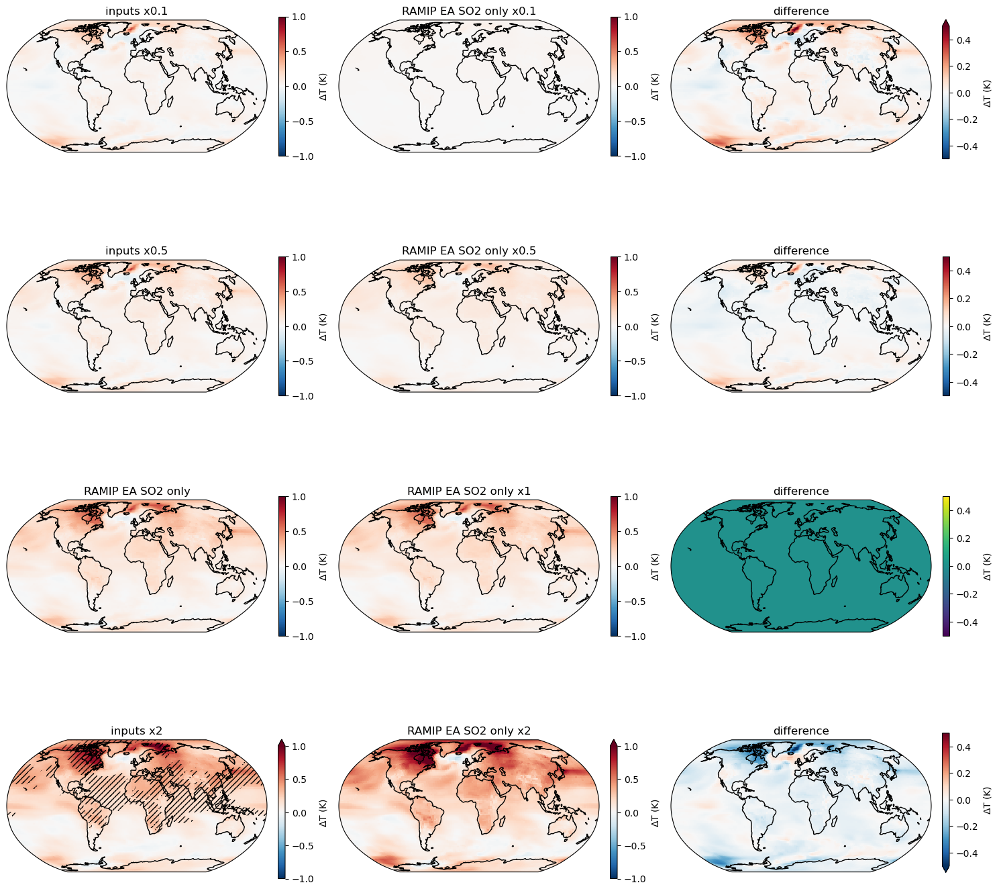

In [23]:
#setup figure for looking at scaling:
# Column 1 is AeroGP posterior given scaled inputs, Column 2 is the hist-aer output scaled by the same factor, Column 3 is the difference between the two.
data_list = [ramipea_so2only_01, ramipea_so2only_05, ramipea_so2only, ramipea_so2only_2]
title = 'RAMIP EA SO2 only'
divnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
diffnorm = colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5)
year_slice = slice(2045,2064)
scaling_fig(data_list, title, divnorm, diffnorm, year_slice)

In [26]:
#see if there are non-linear responses to combination of species: column 1 is RAMIP EA scaled, column 2 is the sum of individual species scaled, column 3 is the difference between the two.

#get other species:
ramipea_bconly_01 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea01_bconly_20250325-161150.nc')
ramipea_bconly_05 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea05_bconly_20250325-161238.nc')
ramipea_bconly = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea_bconly_20250325-161429.nc')
ramipea_bconly_2 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea2_bconly_20250325-161546.nc')

ramipea_oconly_01 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea01_oconly_20250325-161827.nc')
ramipea_oconly_05 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea05_oconly_20250325-161754.nc')
ramipea_oconly = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea_oconly_20250325-161724.nc')
ramipea_oconly_2 = xr.open_dataset('../logs/lr_1lin/RAMIP EA/scaling_exp/posterior_predictY_ramip_ea2_oconly_20250325-161651.nc')



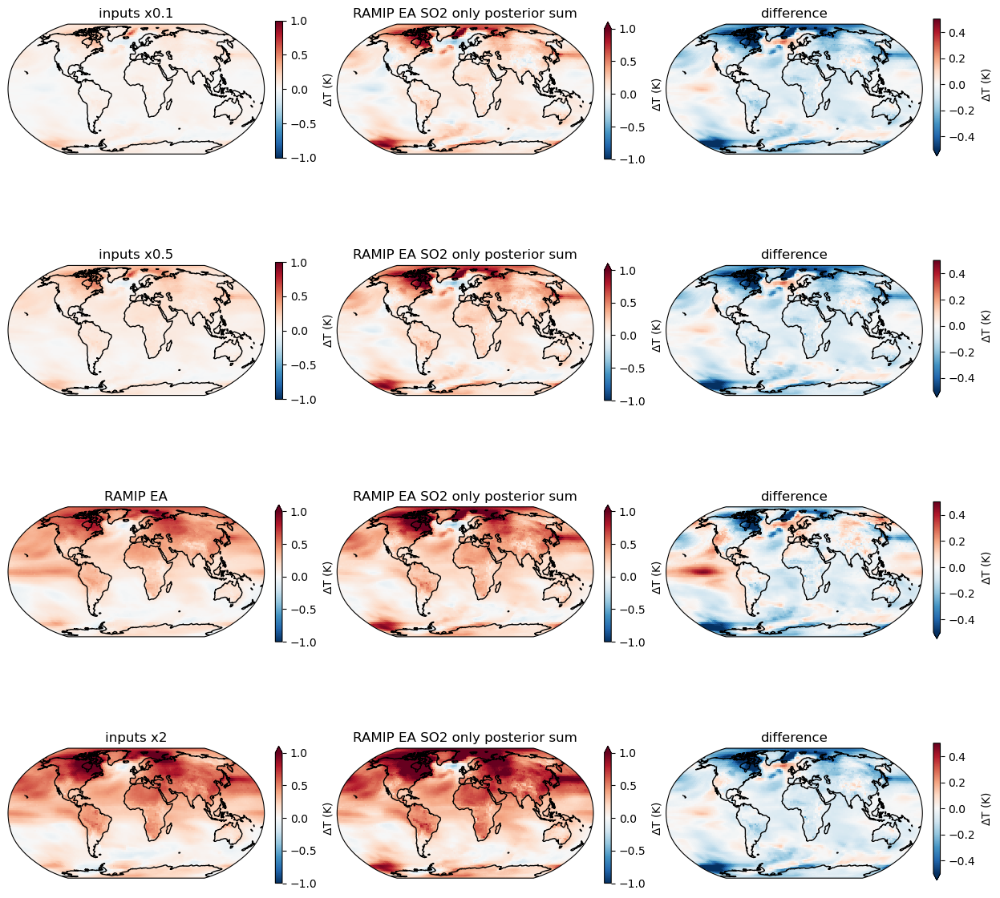

In [ ]:

fig, axs = plt.subplots(4,3, figsize=(15, 15), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.flatten()
titles = ['inputs x0.1', 'inputs x0.5', 'RAMIP EA', 'inputs x2']
data_list_ramipea = [ramipea_01, ramipea_05, ramipea, ramipea_2]
data_list_so2 = [ramipea_so2only_01, ramipea_so2only_05, ramipea_so2only, ramipea_so2only_2]
data_list_bc = [ramipea_bconly_01, ramipea_bconly_05, ramipea_bconly, ramipea_bconly_2]
data_list_oc = [ramipea_oconly_01, ramipea_oconly_05, ramipea_oconly, ramipea_oconly_2]


for ii in range(4):
    data_ramipea = data_list_ramipea[ii]
    data_so2 = data_list_so2[ii]
    data_bc = data_list_bc[ii]
    data_oc = data_list_oc[ii]

    data_mean = data_ramipea['posterior'].sel(year=year_slice).mean('year')
    data_sum = data_so2['posterior'].sel(year=year_slice).mean('year') + data_bc['posterior'].sel(year=year_slice).mean('year') + data_oc['posterior'].sel(year=year_slice).mean('year')

    #robust_data = (data['posterior'].where(np.abs(data['posterior']) > 0.5*data['posterior std'])).sel(year=year_slice).mean('year', skipna=True)

    #first column plot data:
    ax = axs[ii*3] # fist column (0,3,6,9)
    ax.coastlines()
    data_mean.plot(ax=ax, transform=ccrs.PlateCarree(), norm=divnorm, cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
    #ax.pcolor(robust_data.lon, robust_data.lat, robust_data, transform=ccrs.PlateCarree(), hatch='////', alpha=0)
    ax.set_title(titles[ii])

    #second column plot data normalized to original:
    ax = axs[(ii*3)+1] # second column (1,4,7,10)
    ax.coastlines()
    data_sum.plot(ax=ax, transform=ccrs.PlateCarree(), norm=divnorm, cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
    ax.set_title('posterior sum')

    #third column plot difference:
    ax = axs[(ii*3)+2] # third column (2,5,8,11)
    ax.coastlines()
    norm_diff = data_mean - data_sum
    norm_diff.plot(ax=ax, transform=ccrs.PlateCarree(), norm=diffnorm, cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
    ax.set_title('difference')


Text(0.5, 1.0, 'RAMIP EA OC only')

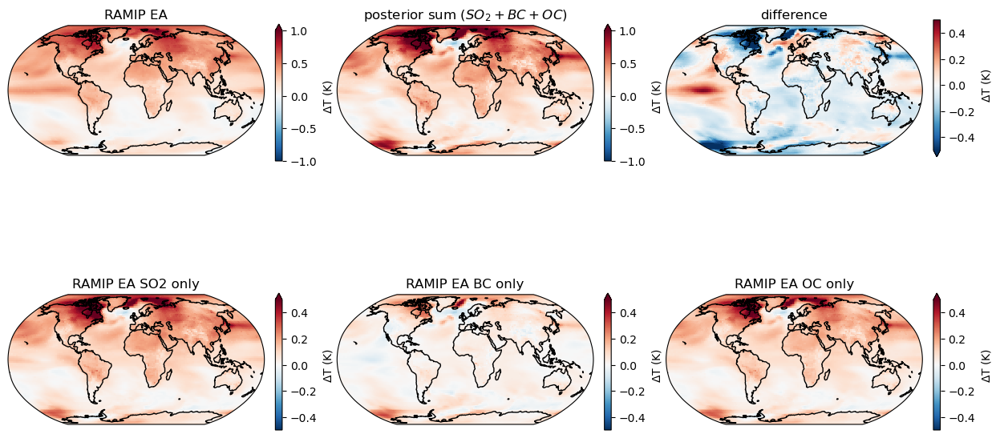

In [31]:

fig, axs = plt.subplots(2,3, figsize=(15, 8), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.flatten()

ax = axs[0]
ax.coastlines()
ramipea['posterior'].sel(year=year_slice).mean('year').plot(ax=ax, norm=colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.), transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
ax.set_title('RAMIP EA')

ax = axs[1]
ax.coastlines()
ramipea_sum = (ramipea_so2only['posterior'].sel(year=year_slice) + ramipea_bconly['posterior'].sel(year=year_slice) + ramipea_oconly['posterior'].sel(year=year_slice)).mean('year')
ramipea_sum.plot(ax=ax, norm=colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.), transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
ax.set_title('posterior sum ($SO_2+BC+OC$)')

ax = axs[2]
ax.coastlines()
norm_diff = ramipea['posterior'].sel(year=year_slice).mean('year') - ramipea_sum
norm_diff.plot(ax=ax, norm=colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5), transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
ax.set_title('difference')

ax = axs[3]
ax.coastlines()
ramipea_so2only['posterior'].sel(year=year_slice).mean('year').plot(ax=ax, norm=colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5), transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
ax.set_title('RAMIP EA SO2 only')

ax = axs[4]
ax.coastlines()
ramipea_bconly['posterior'].sel(year=year_slice).mean('year').plot(ax=ax, norm=colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5), transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
ax.set_title('RAMIP EA BC only')

ax = axs[5]
ax.coastlines()
ramipea_oconly['posterior'].sel(year=year_slice).mean('year').plot(ax=ax, norm=colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5), transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)",'pad':0.04,'fraction':0.025})
ax.set_title('RAMIP EA OC only')



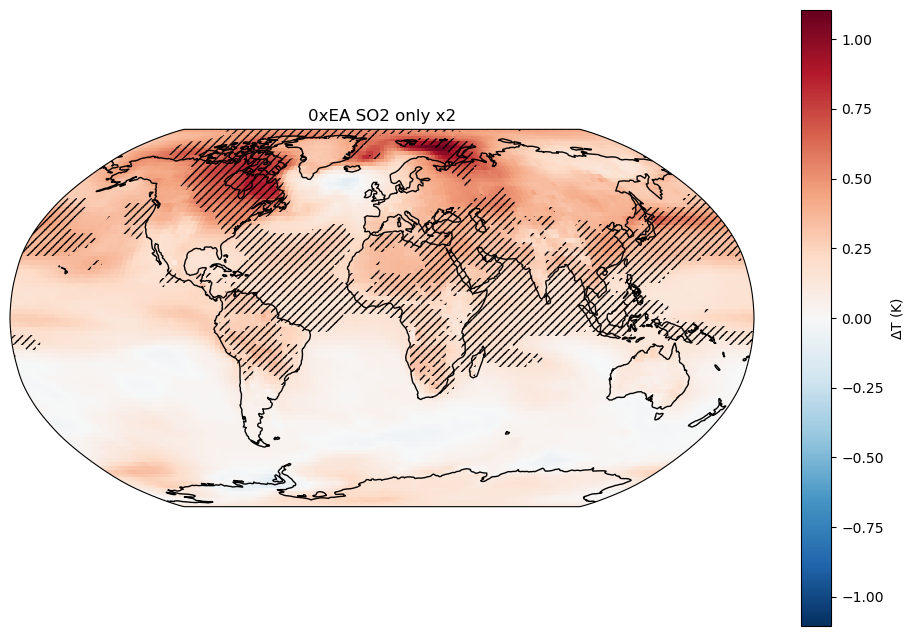

In [61]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.Robinson())
ax.coastlines()
year_slice = slice(2045,2064)
ramipea_so2only_2['posterior'].sel(year=year_slice).mean('year', skipna=True).plot(ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={'label': "$\Delta$T (K)"})
ax.set_title('0xEA SO2 only x2')
plt.pcolor(ramipea_so2only_2['posterior'].lon, ramipea_so2only_2['posterior'].lat, (ramipea_so2only_2['posterior'].where(np.abs(ramipea_so2only_2['posterior']) > 0.5*ramipea_so2only_2['posterior std'])).sel(year=year_slice).mean('year', skipna=True), transform=ccrs.PlateCarree(), hatch='////', alpha=0)

In [5]:
ssp245aer = xr.open_dataset('../logs/logs_ssp245-aer/posterior_predictY_ssp245-aer_20250304-110103.nc')
ssp245aer_01 = xr.open_dataset('../logs/logs_ssp245-aer/posterior_predictY_ssp245-aer_01_20250318-162748.nc')
ssp245aer_05 = xr.open_dataset('../logs/logs_ssp245-aer/posterior_predictY_ssp245-aer_05_20250318-162816.nc')
ssp245aer_2 = xr.open_dataset('../logs/logs_ssp245-aer/posterior_predictY_ssp245-aer_2_20250318-162844.nc')

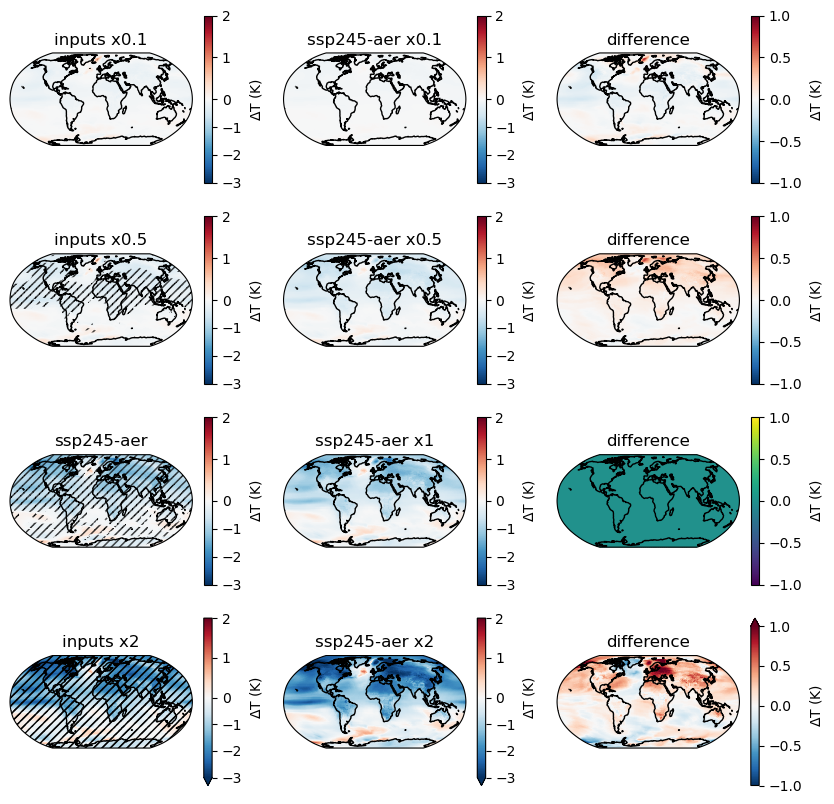

In [8]:
#setup figure for looking at scaling:
# Column 1 is AeroGP posterior given scaled inputs, Column 2 is the hist-aer output scaled by the same factor, Column 3 is the difference between the two.
data_list = [ssp245aer_01, ssp245aer_05, ssp245aer, ssp245aer_2]
title = 'ssp245-aer'
divnorm = colors.TwoSlopeNorm(vmin=-3., vcenter=0., vmax=2.)
diffnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
year_slice = slice(2020,2040)

scaling_fig(data_list, title, divnorm, diffnorm, year_slice)

In [46]:
ea5_so2 = xr.open_dataset('../logs/lr_1lin/5xEA SO2 only/posterior_predictY_5xEA_SO2_20250325-010731.nc')
ea5_so2_01 = xr.open_dataset('../logs/lr_1lin/5xEA SO2 only/scaling_exp/posterior_predictY_5xEA_SO2_01_20250325-095615.nc')
ea5_so2_05 = xr.open_dataset('../logs/lr_1lin/5xEA SO2 only/scaling_exp/posterior_predictY_5xEA_SO2_05_20250325-095653.nc')
ea5_so2_2 = xr.open_dataset('../logs/lr_1lin/5xEA SO2 only/scaling_exp/posterior_predictY_5xEA_SO2_2_20250325-095808.nc')

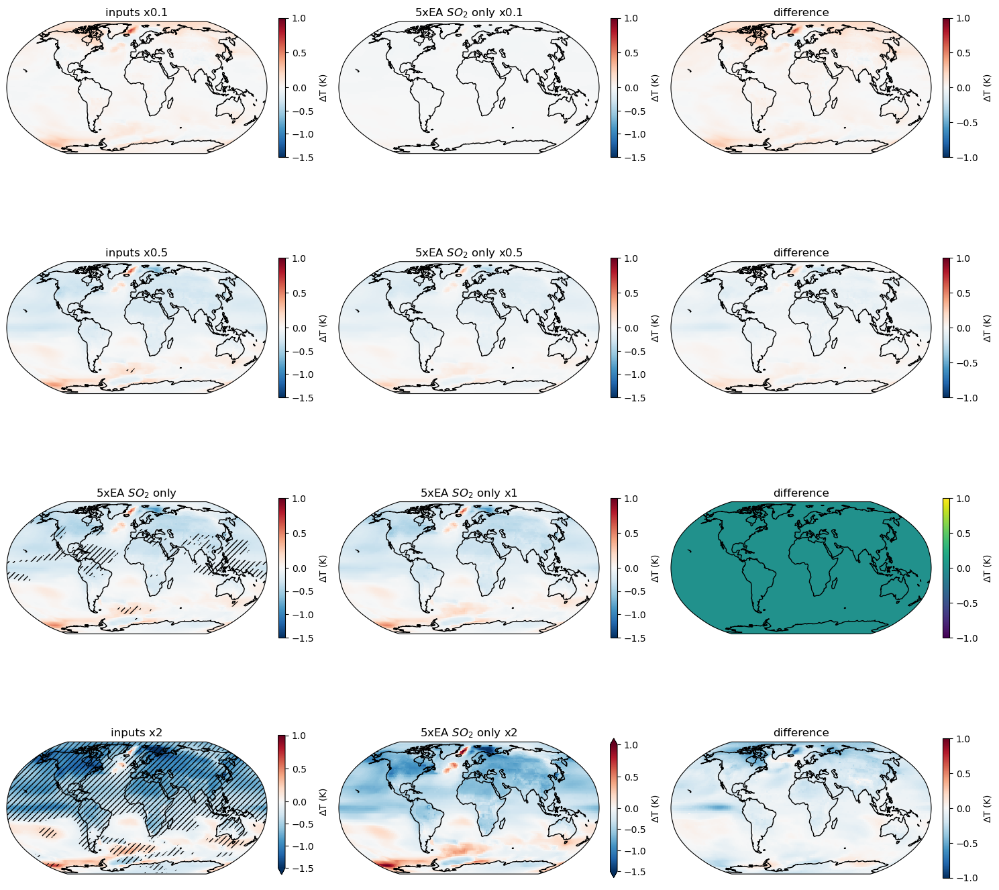

In [51]:
#setup figure for looking at scaling:
# Column 1 is AeroGP posterior given scaled inputs, Column 2 is the hist-aer output scaled by the same factor, Column 3 is the difference between the two.
data_list = [ea5_so2_01, ea5_so2_05, ea5_so2, ea5_so2_2]
title = '5xEA $SO_2$ only'
divnorm = colors.TwoSlopeNorm(vmin=-1.5, vcenter=0., vmax=1.0)
diffnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
year_slice = None

scaling_fig(data_list, title, divnorm, diffnorm, year_slice)

In [14]:
hist_aer = xr.open_dataset('../logs/logs_hist-aer/posterior_predictY_hist-aer_20250226-151807.nc')
hist_aer01 = xr.open_dataset('../logs/logs_hist-aer/sensitivity_test/posterior_predictY_histaer01_20250311-211835.nc')
hist_aer2 = xr.open_dataset('../logs/logs_hist-aer/sensitivity_test/posterior_predictY_histaer2_20250311-211923.nc')
hist_aer05 = xr.open_dataset('../logs/logs_hist-aer/sensitivity_test/posterior_predictY_histaer05_20250311-211859.nc')


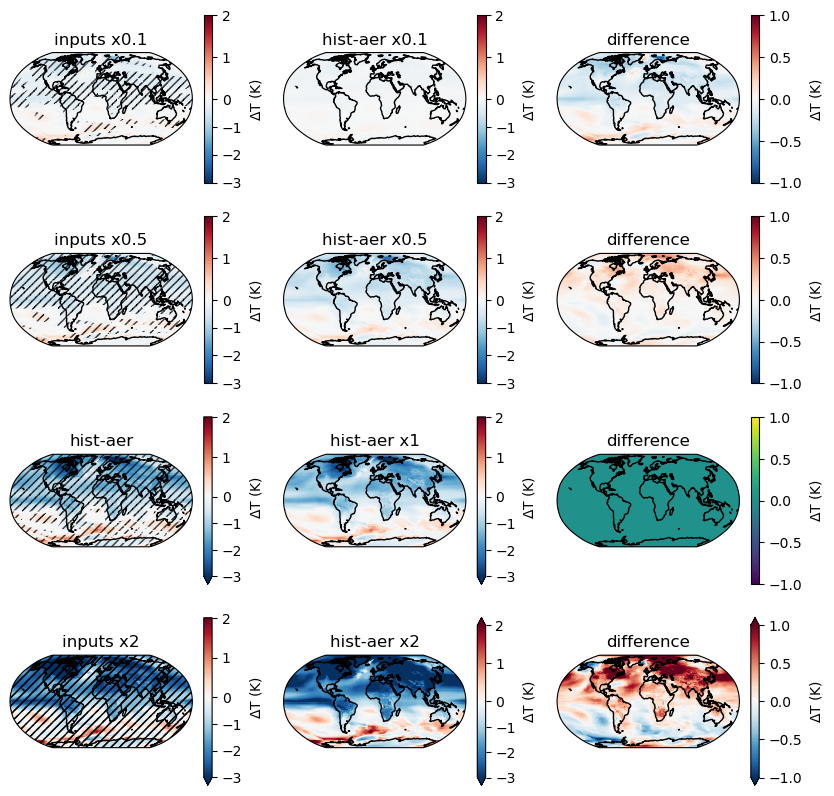

In [15]:
#setup figure for looking at scaling:
# Column 1 is AeroGP posterior given scaled inputs, Column 2 is the hist-aer output scaled by the same factor, Column 3 is the difference between the two.
data_list = [hist_aer01, hist_aer05, hist_aer, hist_aer2]
title = 'hist-aer'
divnorm = colors.TwoSlopeNorm(vmin=-3., vcenter=0., vmax=2.)
diffnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
year_slice = slice(1995,2015)

scaling_fig(data_list, title, divnorm, diffnorm, year_slice)

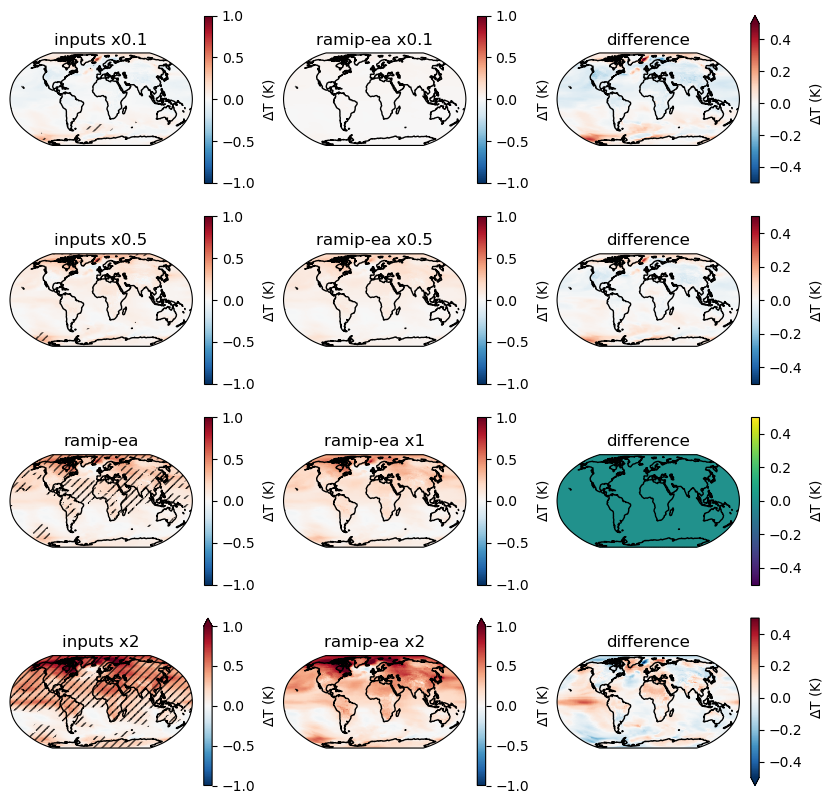

In [24]:
ea01 = xr.open_dataset('../logs/logs_RAMIP EA/sensitivity_test/posterior_predictY_ramipEA01_20250311-211946.nc')
ea05 = xr.open_dataset('../logs/logs_RAMIP EA/sensitivity_test/posterior_predictY_ramipEA05_20250311-212003.nc')
ea2 = xr.open_dataset('../logs/logs_RAMIP EA/sensitivity_test/posterior_predictY_ramipEA2_20250311-212022.nc')
ea = xr.open_dataset('../logs/logs_RAMIP EA/posterior_predictY_ramip_ea_20250305-043748.nc')

data_list = [ea01, ea05, ea, ea2]
title = 'ramip-ea'
divnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
diffnorm = colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5)
year_slice=slice(2045,2065)

scaling_fig(data_list, title, divnorm, diffnorm, year_slice)

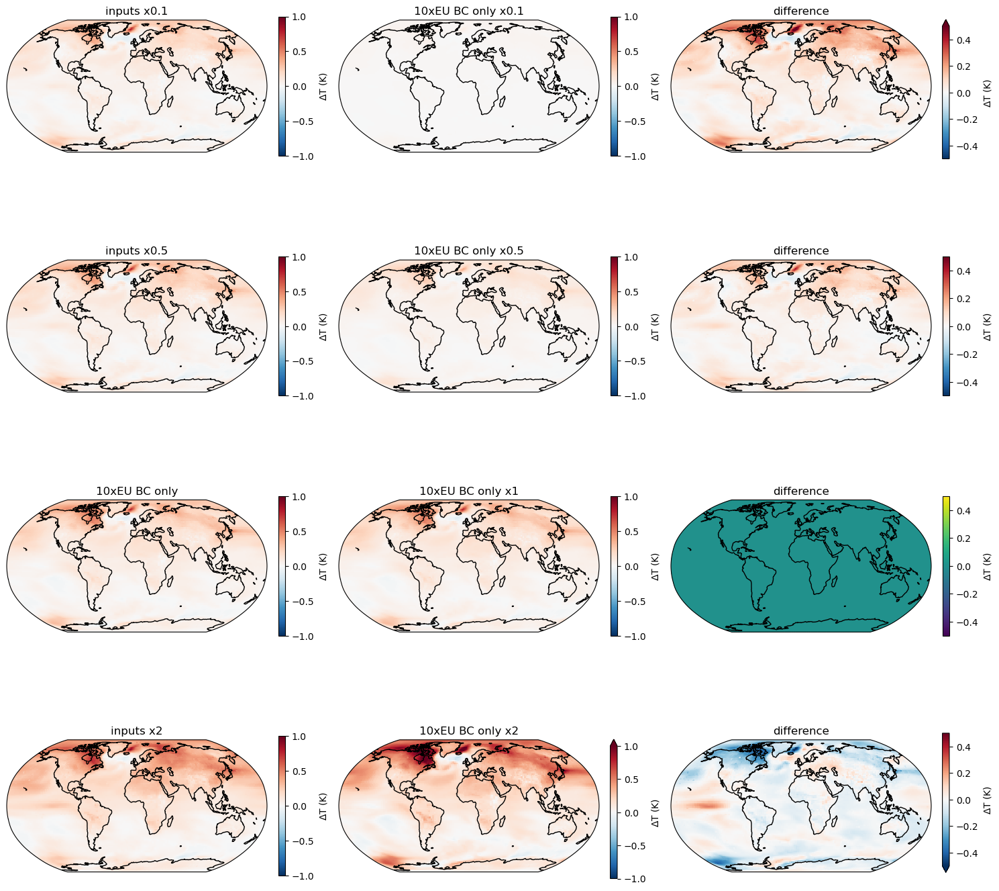

In [45]:
eu10bc_AeroGP = xr.open_dataset('../logs/lr_1lin/10xEU BC only/posterior_predictY_10xEU_BC_20250325-015301.nc')
eu10bc01_AeroGP = xr.open_dataset('../logs/lr_1lin/10xEU BC only/scaling_exp/posterior_predictY_EUBC01_20250325-175514.nc')
eu10bc05_AeroGP = xr.open_dataset('../logs/lr_1lin/10xEU BC only/scaling_exp/posterior_predictY_EUBC05_20250325-175700.nc')
eu10bc2_AeroGP = xr.open_dataset('../logs/lr_1lin/10xEU BC only/scaling_exp/posterior_predictY_EUBC2_20250325-175733.nc')

data_list = [eu10bc01_AeroGP, eu10bc05_AeroGP, eu10bc_AeroGP, eu10bc2_AeroGP]
title = '10xEU BC only'
divnorm = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
diffnorm = colors.TwoSlopeNorm(vmin=-0.5, vcenter=0., vmax=0.5)
year_slice=False

scaling_fig(data_list, title, divnorm, diffnorm, year_slice)

In [22]:
print('10xEU BC x0.1: ', lat_weighted_mean(eu10bc01_AeroGP['posterior']).values)
print('10xEU BC x0.5: ', lat_weighted_mean(eu10bc05_AeroGP['posterior']).values)
print('10xEU BC: ', lat_weighted_mean(eu10bc_AeroGP['posterior']).values)
print('10xEU BC x2: ', lat_weighted_mean(eu10bc2_AeroGP['posterior']).values)


10xEU BC x0.1:  0.09940395553228355
10xEU BC x0.5:  0.10964440627117603
10xEU BC:  0.13537738206408595
10xEU BC x2:  0.14799624491862268


In [48]:
histaer = xr.open_dataset('../logs/before pert_region fix/logs_hist-aer/posterior_predictY_hist-aer.nc')
histaer01 = xr.open_dataset('../logs/before pert_region fix/logs_hist-aer/posterior_predictY_histaer01_20250121-180152.nc')
histaer05 = xr.open_dataset('../logs/before pert_region fix/logs_hist-aer/posterior_predictY_histaer05_20250121-180450.nc')
histaer2 = xr.open_dataset('../logs/before pert_region fix/logs_hist-aer/posterior_predictY_histaer2_20250121-180557.nc')

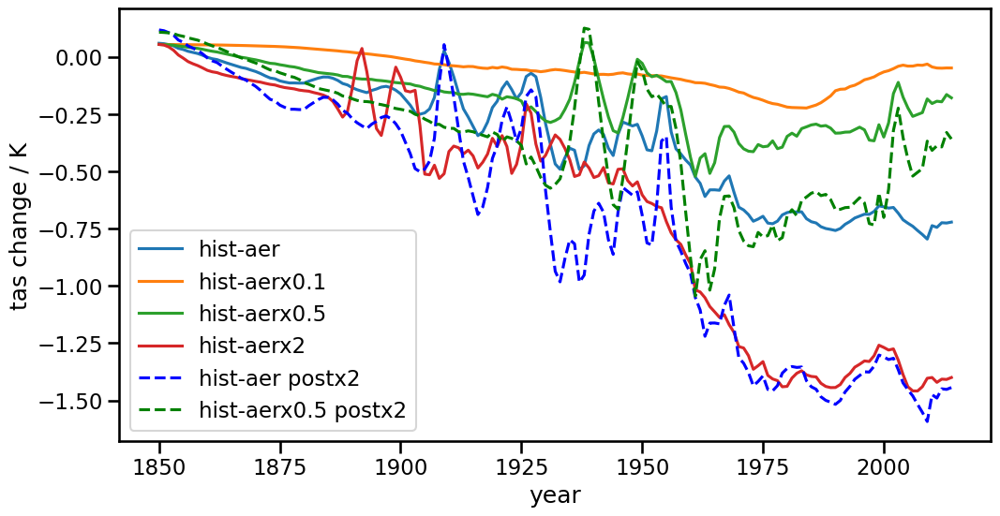

In [49]:
with sns.plotting_context('talk'):
    plt.figure(figsize=(12, 6))
    lat_weighted_mean(histaer['posterior']).plot(label='hist-aer')
    lat_weighted_mean(histaer01['posterior']).plot(label='hist-aerx0.1')
    lat_weighted_mean(histaer05['posterior']).plot(label='hist-aerx0.5')
    lat_weighted_mean(histaer2['posterior']).plot(label='hist-aerx2')
    lat_weighted_mean(histaer['posterior']*2).plot(label='hist-aer postx2', linestyle='--', color='blue')
    lat_weighted_mean(histaer05['posterior']*2).plot(label='hist-aerx0.5 postx2', linestyle='--', color='green')
    plt.legend()
    plt.ylabel('tas change / K')